In [ ]:
# this is the "must-do configuration", inherited from https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5, nothing to explain :)
# you must run it if you want to operate the rest of the code :(
# for the convenience, i deleted all comments of original version
!pip install pyyaml==5.1

!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu102/torch1.9/index.html
# exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu102/torch1.9/index.html


In [ ]:
# this also is "must-do configuration" I did not change anything from original version
# check pytorch installation: 
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
assert torch.__version__.startswith("1.9")   # please manually install torch 1.9 if Colab changes its default version

1.9.0+cu102 True


In [ ]:
# this also is "must-do configuration" I did not change anything from original version
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

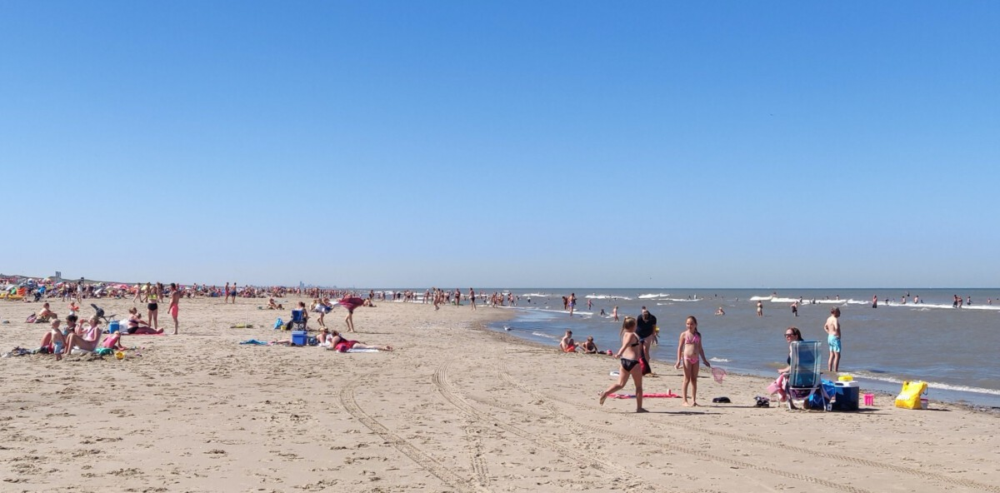

In [ ]:
# load the image and show it
# i have 4 photos of beach's scene 

im = cv2.imread("./beach.jpg")
cv2_imshow(im)



The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


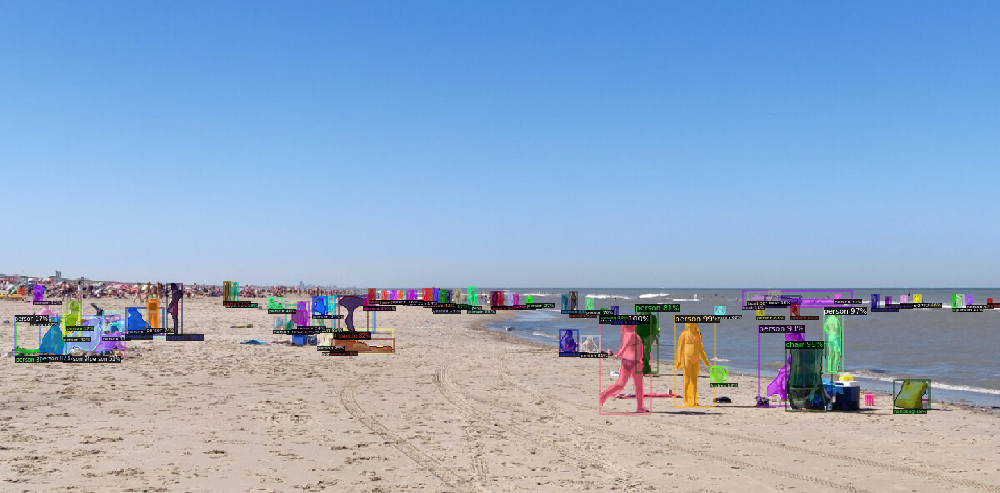

In [ ]:
cfg = get_cfg()


cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml")) #load the model
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.1 # set threshold for this model

cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml")#load parameters
#cfg.MODEL.DEVICE = "cpu" # Googlecolab stopped me from using cuda and asked me for using premium version :), 
#I therefore switched to non cuda (cpu), it is much slower but no option
# you can (and should) comemnt this line if you can still use cuda 

predictor = DefaultPredictor(cfg) #run predictor
outputs = predictor(im)
# now I visualize the instances'segmentation (also from the original version)

v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2) #this "scale" needs to be tuned to fit the photo
# if the photo is so small, you may want the scale to be bigger and vice versa
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])  # show instances segmentation

# in the readme, I showed the outcome of running instance segentation for 4 photos, you can easily check other photo by changing im = cv2.imread("./beach.jpg")
# I have a whole implementation at the end for the expansion, also changing the imread there, is more convenient (no need to run one-by-one)

In [ ]:
sky detection using panoptic segmentation
im = cv2.imread("./beach.jpg")
#cv2_imshow(im)
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-PanopticSegmentation/panoptic_fpn_R_50_3x.yaml"))#load panoptic segmentation model
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.1 # set threshold for this model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-PanopticSegmentation/panoptic_fpn_R_50_3x.yaml")#load parameters
#cfg.MODEL.DEVICE = "cpu"
predictor = DefaultPredictor(cfg)
outputs = predictor(im)

The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


In [ ]:
# get the id of category "sky" from COCO database (for every session's run, this id is different, but the category_id for sky is identical (40))
info_dict=outputs["panoptic_seg"][1]

sky_id=0

for index in range (len(info_dict)):
  if info_dict[index]['category_id']==40: # sky's category_id
    sky_id=info_dict[index]['id']
    break
print('sky id',sky_id)

sky id 35


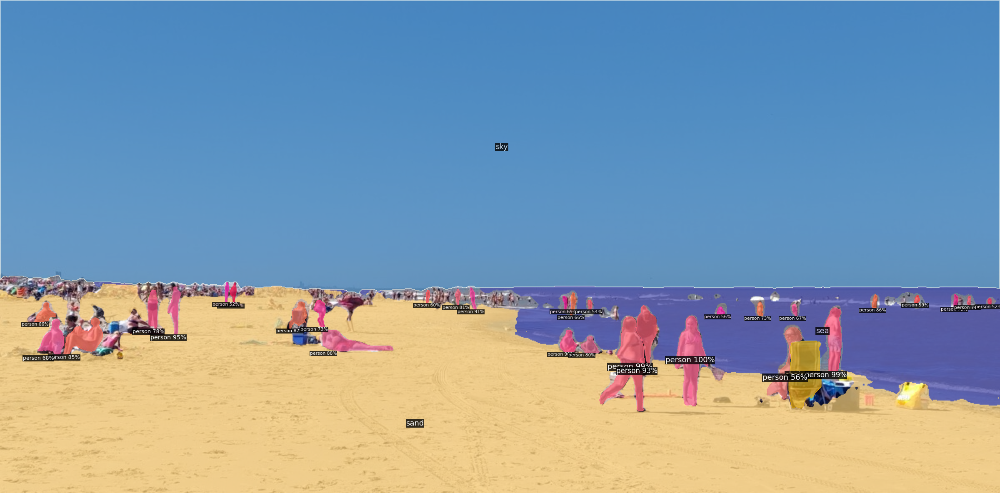

crop i is: 353 592


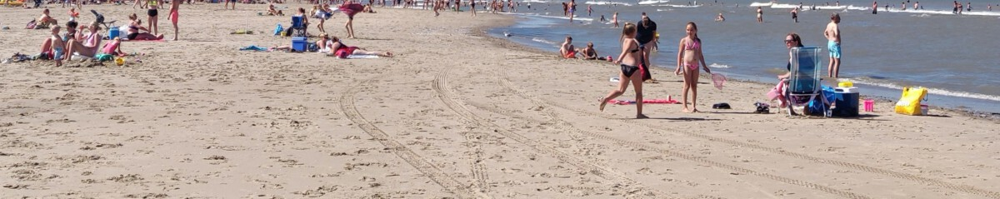

In [ ]:
#visualize panoptic segmentation

v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=2) #this "scale" needs to be tuned to fit the photo
# if the photo is so small, you may want the scale to be bigger and vice versa
out = v.draw_panoptic_seg(outputs["panoptic_seg"][0].to("cpu"),outputs["panoptic_seg"][1])
cv2_imshow(out.get_image()[:, :, ::-1]) # show panoptic segmentation
# crop the sky in the original image
import numpy as np
id_mat=outputs["panoptic_seg"][0].to("cpu").numpy()
crop_i=0
for index in range(id_mat.shape[0]):

 if not (np.any(id_mat[index]==sky_id)):  #exhaustive checking of sky, if any pixel belongs to "sky" in a row
 # that row will be cut
  crop_i=index  #this is last row of sky or the boundary of the crop
  break
print('crop i is:',crop_i,id_mat.shape[0])

im=im[crop_i:,:]
cv2_imshow(im)  #show photo after crop



The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


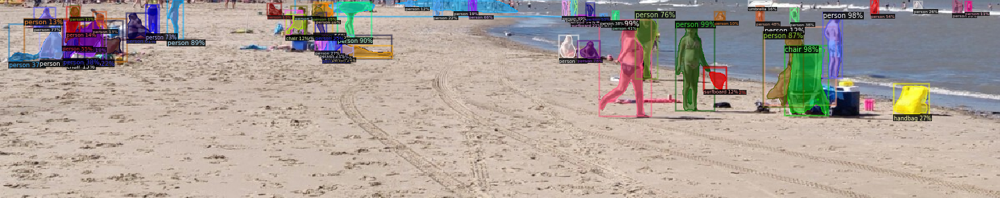

In [ ]:
# Run exactly the same instance segmentation for cropped photo
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml")) #load the model
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.1 # set threshold for this model




cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml")#load parameters
#cfg.MODEL.DEVICE = "cpu" # Googlecolab stopped me from using cuda and asked me for using premium version :), 
#I therefore switched to non cuda (cpu), it is much slower but no option
# you can (and should) comemnt this line if you can still use cuda 

predictor = DefaultPredictor(cfg) #run predictor
outputs = predictor(im)
# now I visualize the instances'segmentation (also from the original version)

v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2) #this "scale" needs to be tuned to fit the photo
# if the photo is so small, you may want the scale to be bigger and vice versa
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])  # show instances segmentation


now it's the expansion. They are not questions, but some problems I want to discuss further (of course that is what I suppose we will talk in the interview)


I/ Is the sky removal really useful for the instances segmatation?
the sky removal supposes to reduce the running-time for instances segmatation, it will  benefit "the real time operation". However, standalone instances segmentation or cascade sky-detector->sky cropping->instance segmatation, which one is faster?

The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


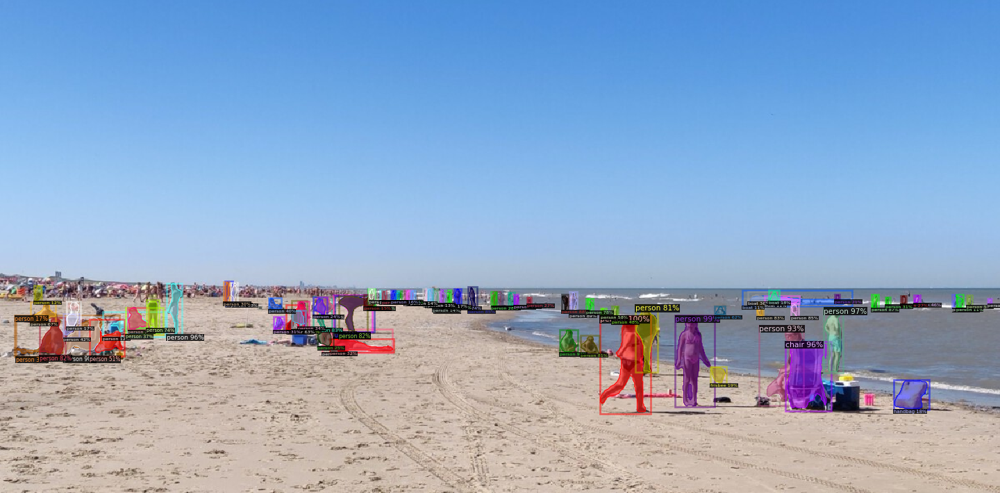

In [ ]:
# it runs the isntances segmmenation and check the time 

from alone_seg import standalone_seg
import cv2
im = cv2.imread("./beach.jpg")
standalone_seg(im) #you can change the photo you want to run
# then with one click, you can run the instances segmentation 

took 3s to get this one (with cuda enabled, by chance sometime they let me use it and better to use it)



The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


sky id 35


The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


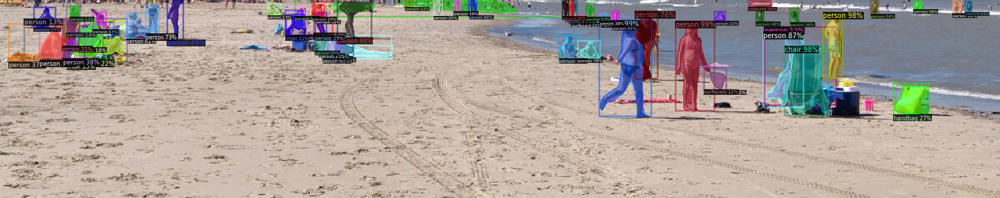

In [ ]:

from sky_crop import crop_sky_seg
import cv2
im = cv2.imread("./beach.jpg")
crop_sky_seg(im)# with one click, you can run the cropped sky instances segmentation 

took 3s to run this one with cuda
So we can roughly conclude the sky crop does not benefit the instances's segmentation.
Nevertheless, someone can argue that the sky detection just needs to be done once, then it will save time instead of running 2 segmentations. Unfortunately it only is viable if the configuration of the frame is not altered (i.e the position is not changed) and if this one is correct, we even do not need to do automatic sky detection but we can manually find the sky's boundary and crop it (because the sky's position is static for all frames)

II/ this is another sky detection using exhausted line detector (Hough transform)

The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


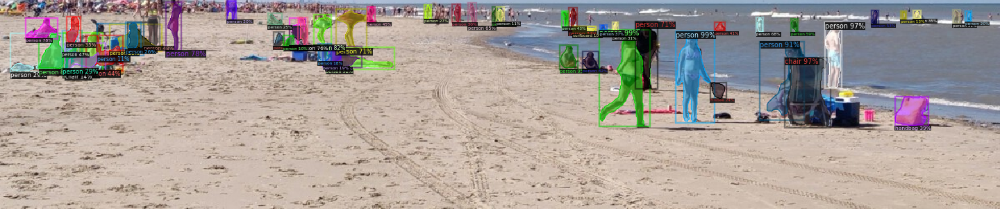

In [ ]:
from no_sky_seg import hough_sky_seg
import cv2
im = cv2.imread("./beach.jpg")
hough_sky_seg(im)

took 2s for it with cuda !!!!
we will talk more about it

The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


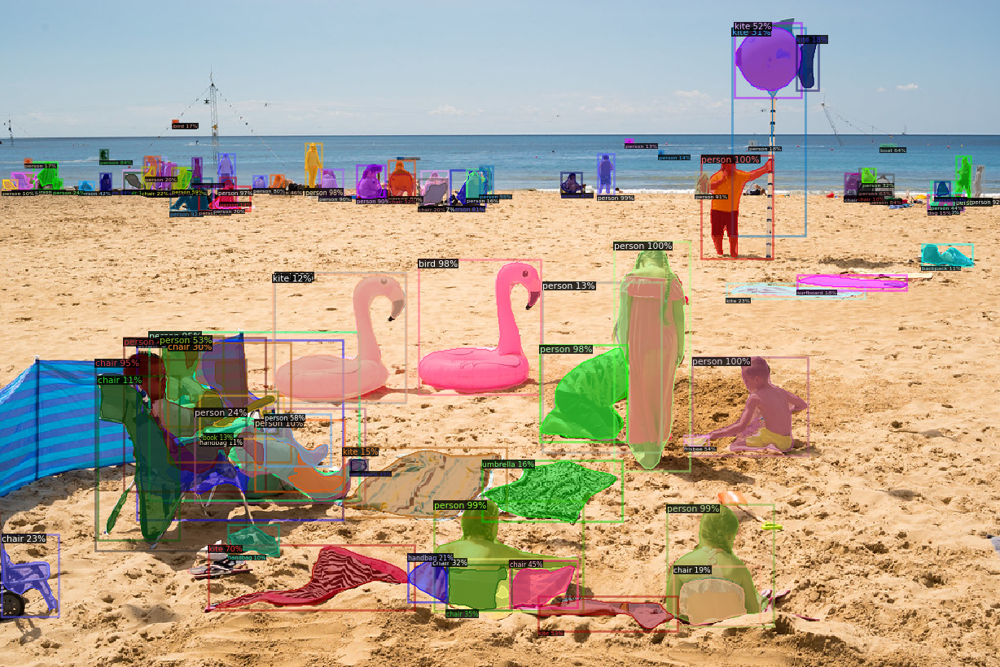

The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


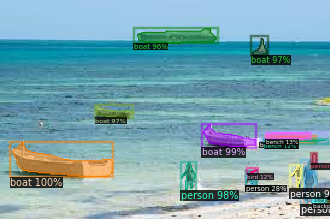

The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


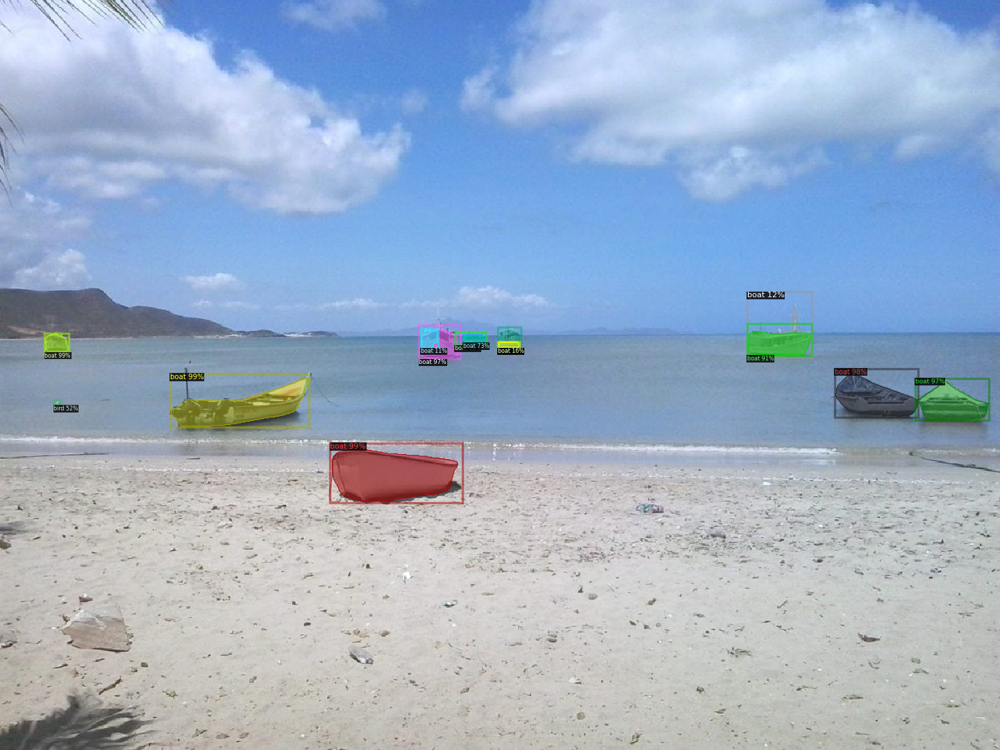

In [ ]:
# here I run instance segmentation for 3 other photos

from alone_seg import standalone_seg
import cv2


im = cv2.imread("./beach2.jpg")
standalone_seg(im) 
im = cv2.imread("./beach3.jpg")
standalone_seg(im) 
im = cv2.imread("./beach4.jpg")
standalone_seg(im) 

took 7s totally with cuda

The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


sky id 44


The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


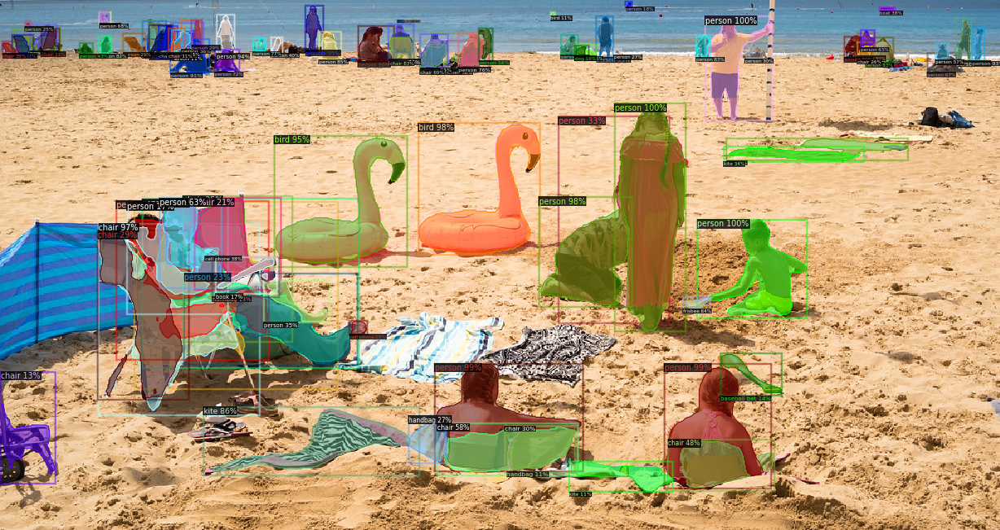

The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


sky id 10


The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


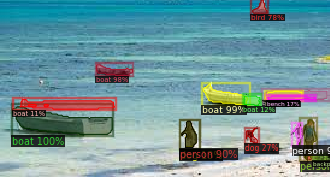

The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


sky id 14


The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


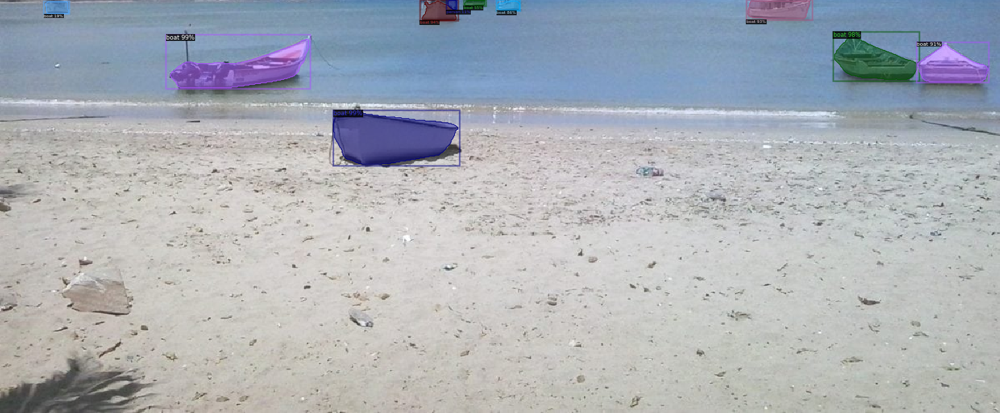

In [ ]:
# run 3 other photos with cropped sky by panoptic segmentation
from sky_crop import crop_sky_seg
import cv2
im = cv2.imread("./beach2.jpg")
crop_sky_seg(im)# with one click, you can run the cropped sky instances segmentation 
im = cv2.imread("./beach3.jpg")
crop_sky_seg(im)
im = cv2.imread("./beach4.jpg")
crop_sky_seg(im)

took 10s to run it with cuda

The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


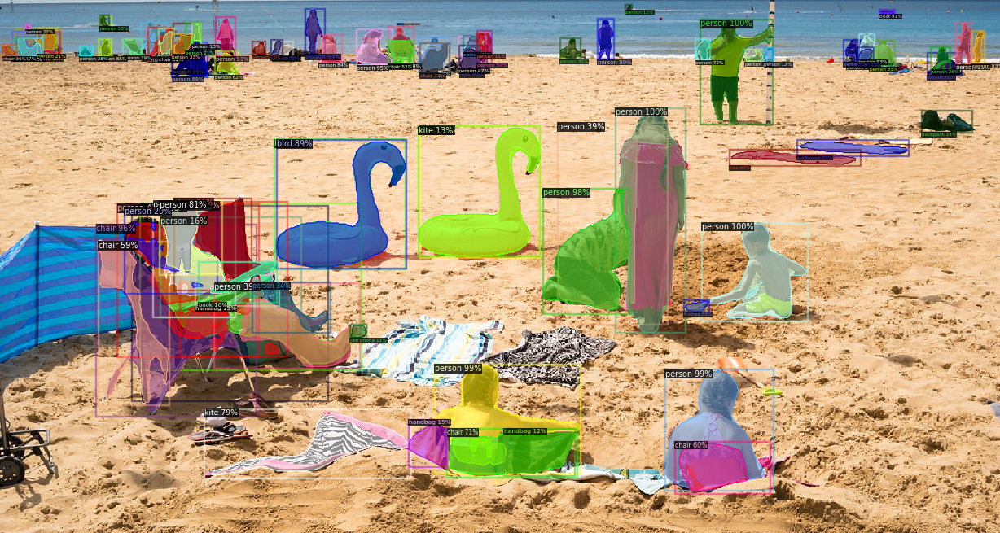

The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


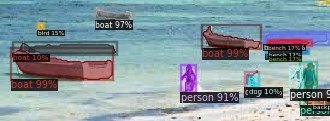

The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


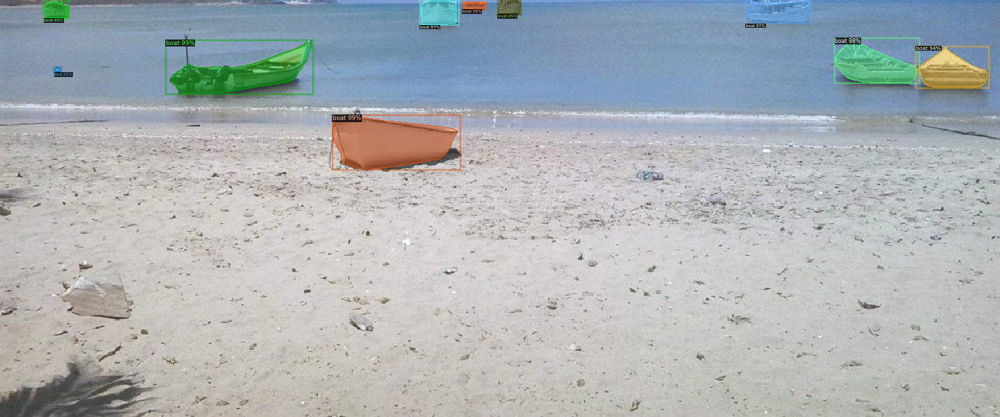

In [ ]:
# run 3 other photos with cropped sky by my hough-based sky detector

from no_sky_seg import hough_sky_seg
import cv2
im = cv2.imread("./beach2.jpg")
hough_sky_seg(im)
im = cv2.imread("./beach3.jpg")
hough_sky_seg(im)
im = cv2.imread("./beach4.jpg")
hough_sky_seg(im)

took 6s to run this one with cuda, clearly improved compared to a single photo